In [69]:
using Zygote, Optim
using OrdinaryDiffEq, Flux, DiffEqFlux, LinearAlgebra, Plots
using DiffEqSensitivity

const EIGEN_EST = Ref(0.0f0)
const USE_GPU = Ref(false)
USE_GPU[] = false # the network is small enough such that CPU works just great

false

In [70]:
_gpu(arg) = USE_GPU[] ? gpu(arg) : cpu(arg)
_cu(arg) = USE_GPU[] ? cu(arg) : identity(arg)

_cu (generic function with 1 method)

In [83]:
# operations
function getops(grid, T=Float32)
    N, dz = length(grid), step(grid)
    d = ones(N-2)
    dl = ones(N-3) # super/lower diagonal
    zv = zeros(N-2) # zero diagonal used to extend D* for boundary conditions

    # D1: first order discretization of ∂z
    D1= diagm(-1 => -dl, 0 => d)
    D1_B = hcat(zv, D1, zv)
    D1_B[1,1] = -1
    D1_B = _cu((1/dz)*D1_B)

    # D2: discretization of ∂zz
    D2 = diagm(-1 => dl, 0 => -2*d, 1 => dl)
    κ = 0.05
    D2_B = hcat(zv, D2, zv) #add space for the boundary conditions space for "ghost nodes"
    #we only solve for the interior space steps
    D2_B[1,1] = D2_B[end, end] = 1

    D2_B = _cu((κ/(dz^2)).*D2_B) #add the constant κ as the equation requires and finish the discretization

    # boundary conditions matrix QQ
    Q = Matrix{Int}(I, N-2, N-2)
    QQ = _cu(vcat(zeros(1,N-2), Q, zeros(1,N-2)))

    D1 = D1_B * QQ
    D2 = D2_B * QQ
    EIGEN_EST[] = maximum(abs, eigvals(Matrix(D2)))
    return (D1=T.(D1), D2=T.(D2))
end

function getu0(grid, T=Float32)
    z = grid[2:N-1]
    f0 = z -> T(exp(-200*(z-0.75)^2))
    u0 = f0.(z) |> _gpu
end

function ode_i(u, p, t)
    Φ = u -> cos.(sin.(u.^3) .+ sin.(cos.(u.^2))) # closure: \bar wT = cos(sin(T^3)) + sin(cos(T^2))
    return p.D1*Φ(u) + p.D2*u
end

function ground_truth(grid, tspan)
    prob = ODEProblem(ode_i, u0, (tspan[1], tspan[2]+0.1), ops)
    sol = solve(prob, ROCK4(eigen_est = (integ)->integ.eigen_est = EIGEN_EST[]), abstol = 1e-9, reltol = 1e-9)
    return sol
end

ground_truth (generic function with 1 method)

In [73]:
N = 32
grid = range(0, 1, length = N)
tspan = (0.0f0, 1.5f0)
u0 = getu0(grid)
ops = getops(grid)
soldata = ground_truth(grid, tspan)

ann = Chain(Dense(30,8,tanh), Dense(8,30,tanh)) |> _gpu
pp, re = Flux.destructure(ann)
lyrs = Flux.params(pp);

dudt_ (generic function with 1 method)

In [84]:
# neural pde
function dudt_(u,p,t)
    Φ = re(p)
    return ops.D1*Φ(u) + ops.D2*u
end

function predict_adjoint(fullp)
    Array(concrete_solve(prob, ROCK4(eigen_est = (integ)->integ.eigen_est = EIGEN_EST[]), u0, fullp, saveat = saveat))
end

function loss_adjoint(fullp)
    pre = predict_adjoint(fullp)
    sum(abs2, training_data - pre)
end

loss_adjoint (generic function with 1 method)

In [75]:
function cb(opt_state:: Optim.OptimizationState)
    cur_pred = collect(predict_adjoint(opt_state.metadata["x"]))
    n = size(training_data, 1)
    pl = scatter(1:n,training_data[:,10],label="data", legend =:bottomright,title="Spatial Plot at t=$(saveat[10])")
    scatter!(pl,1:n,cur_pred[:,10],label="prediction")
    pl2 = scatter(saveat,training_data[N÷2,:],label="data", legend =:bottomright, title="Timeseries Plot at Middle X")
    scatter!(pl2,saveat,cur_pred[N÷2,:],label="prediction")
    display(plot(pl, pl2, size=(600, 300)))
    display(opt_state.value)    
    false
end

cb(trace::Optim.OptimizationTrace) = cb(last(trace))

cb (generic function with 3 methods)

In [76]:
saveat = range(tspan..., length = 30) #time range
prob = ODEProblem{false}(dudt_,u0,tspan,pp)
training_data = _cu(soldata(saveat))
concrete_solve(prob, ROCK4(eigen_est = (integ)->integ.eigen_est = EIGEN_EST[]), u0, pp) 
loss_adjoint(pp)

80.42779f0

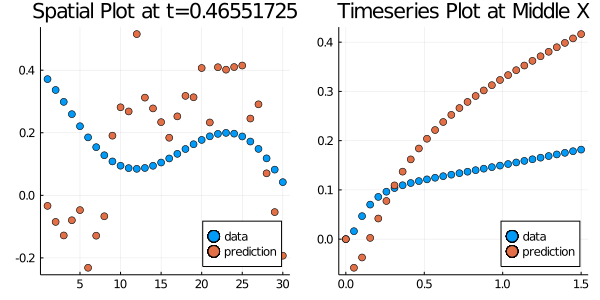

80.42779f0

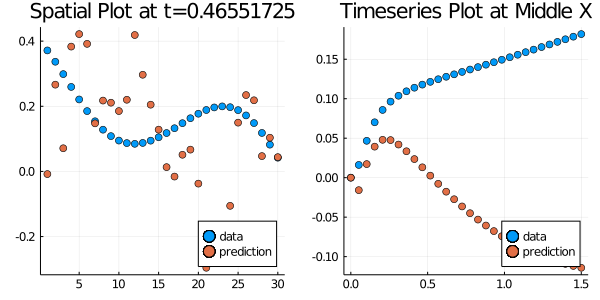

54.361305f0

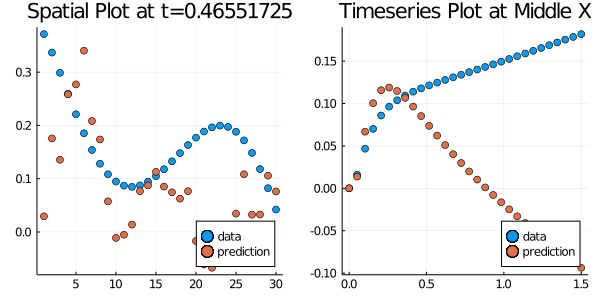

31.848328f0

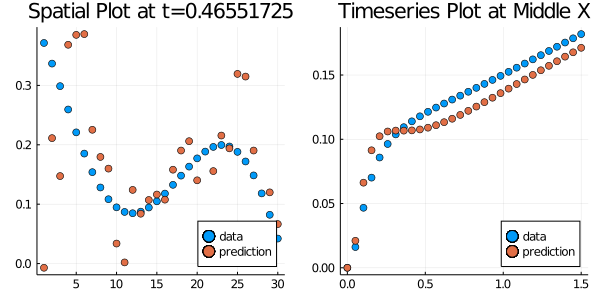

11.054166f0

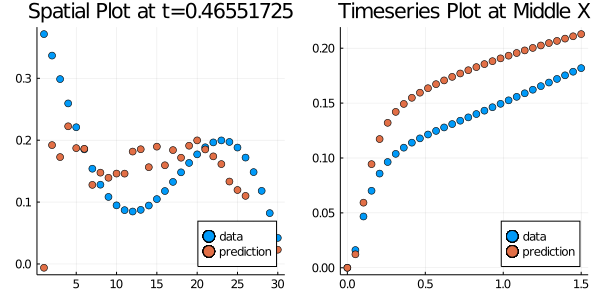

8.301705f0

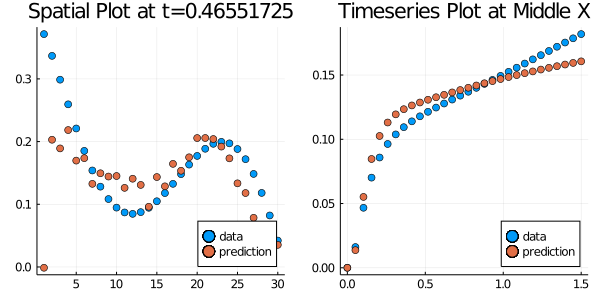

7.147318f0

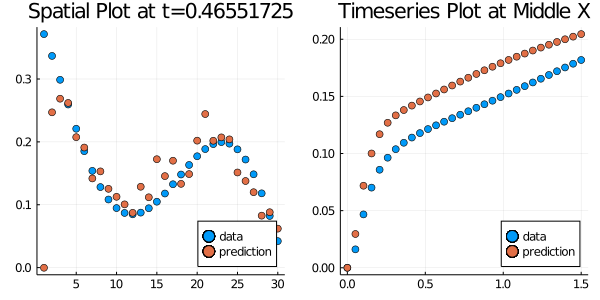

5.6013036f0

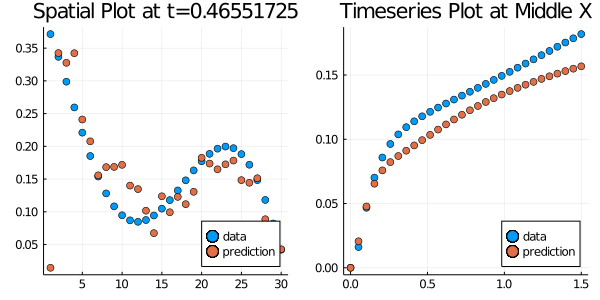

4.959183f0

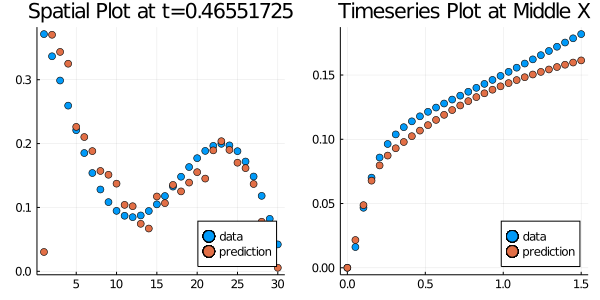

4.3714256f0

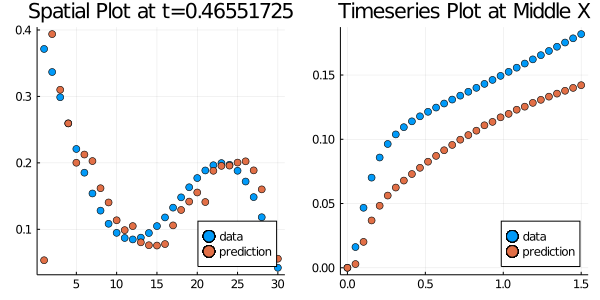

3.7284708f0

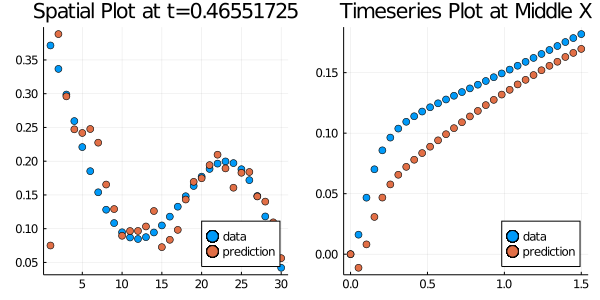

3.1175f0

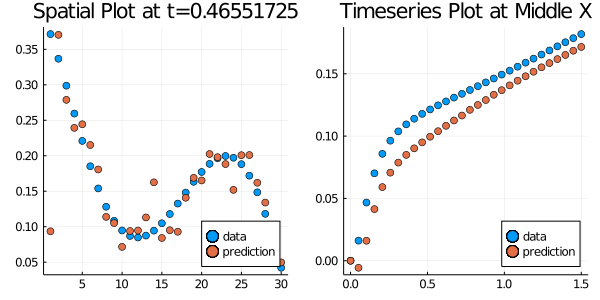

2.731945f0

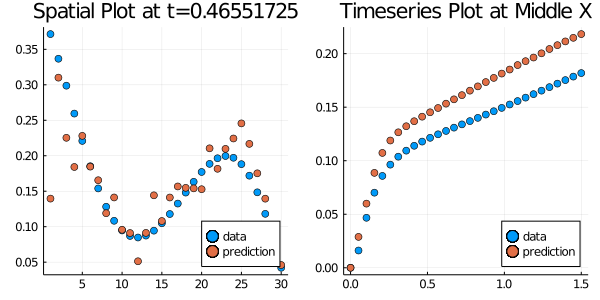

2.2435474f0

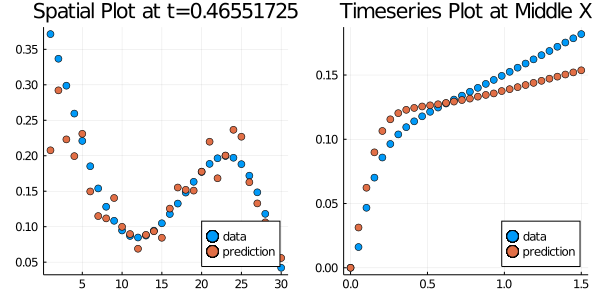

1.4974294f0

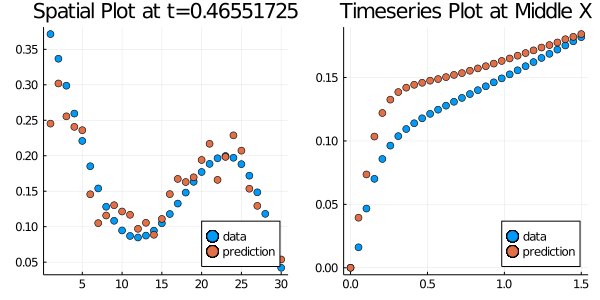

0.99421906f0

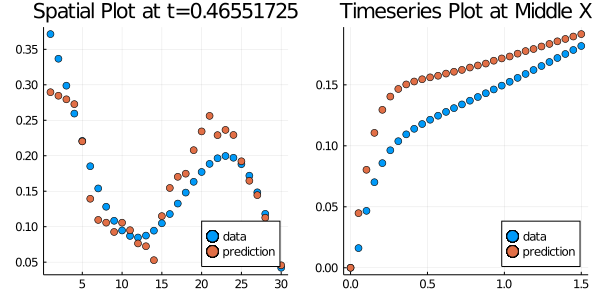

0.899249f0

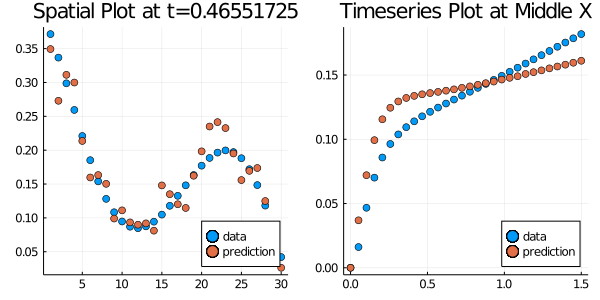

0.6011336f0

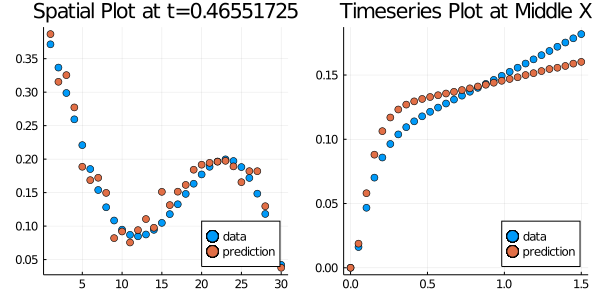

0.35827368f0

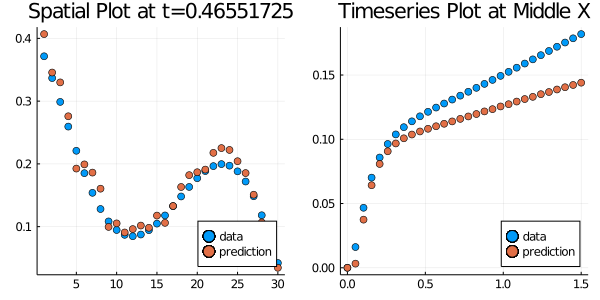

0.27693707f0

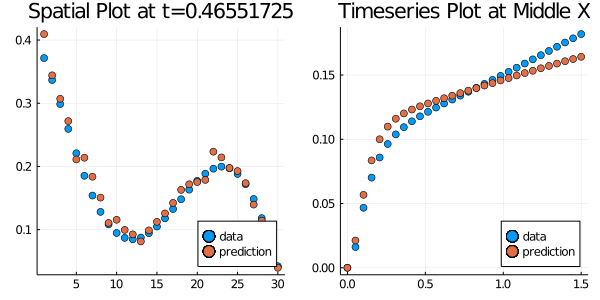

0.19410338f0

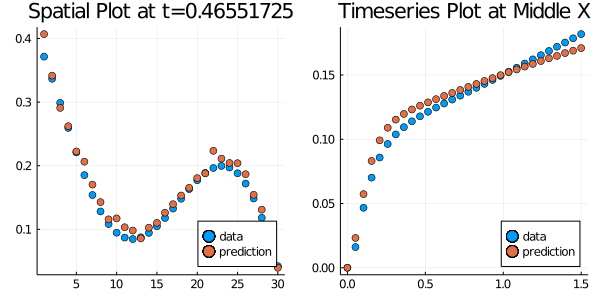

0.14524387f0

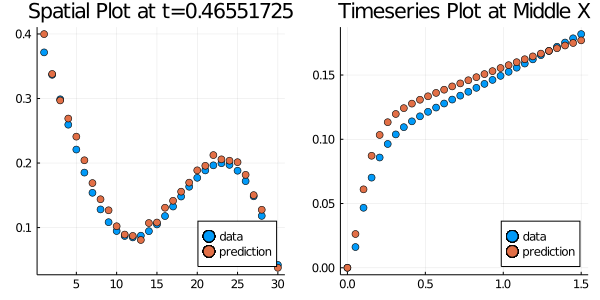

0.10951804f0

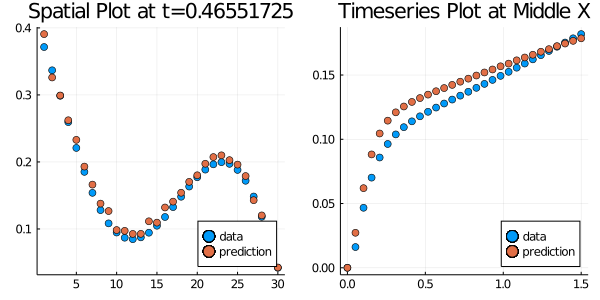

0.084157325f0

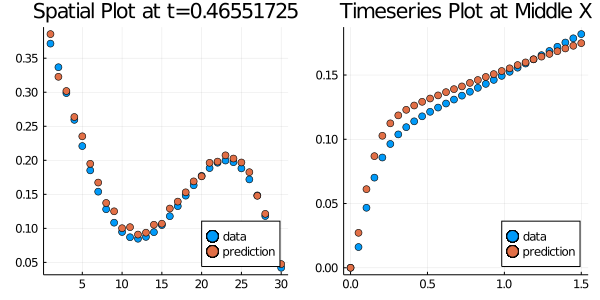

0.06842151f0

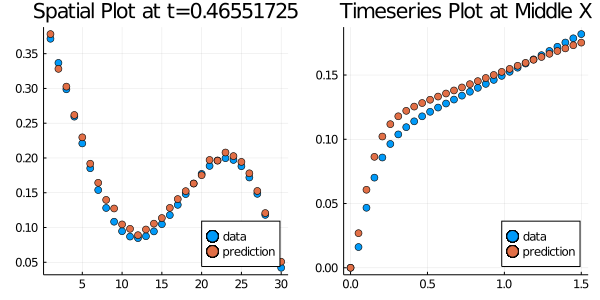

0.050258826f0

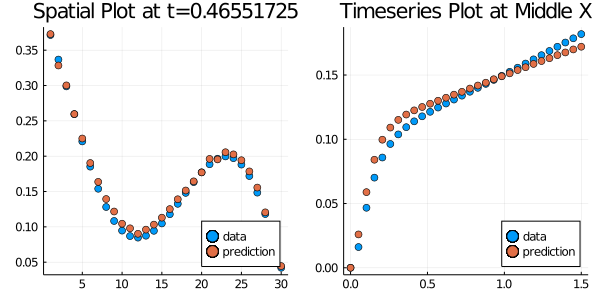

0.040476844f0

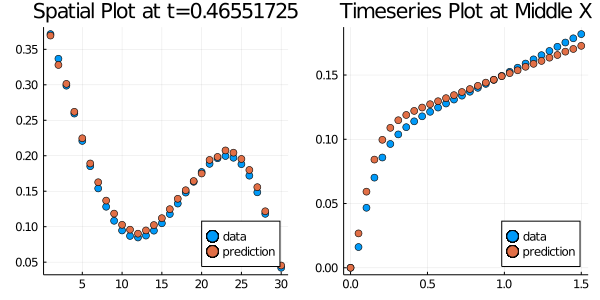

0.03572314f0

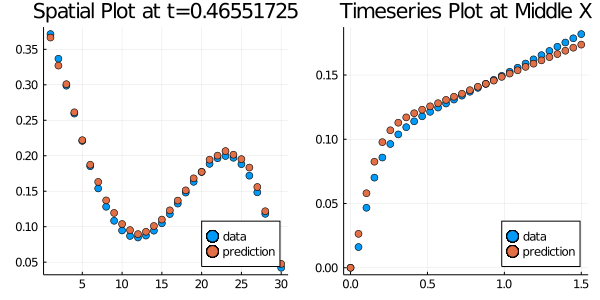

0.03238904f0

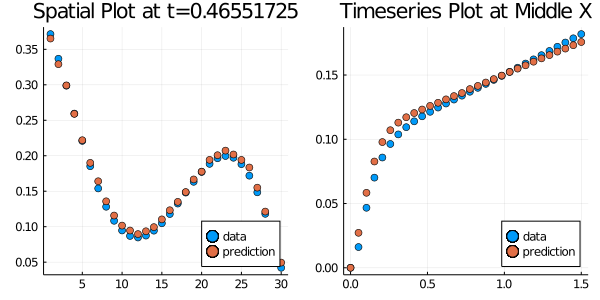

0.029988628f0

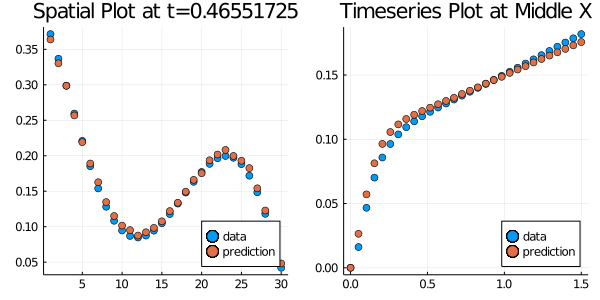

0.02744809f0

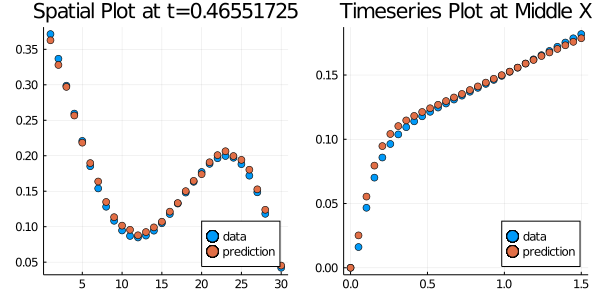

0.025078349f0

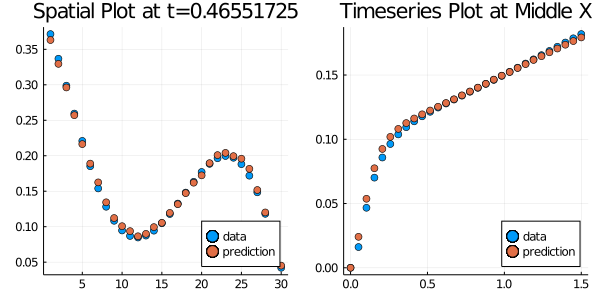

0.022736628f0

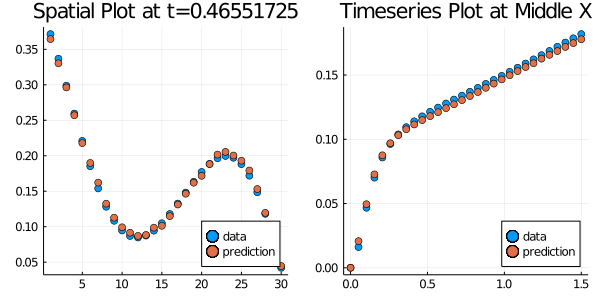

0.020602414f0

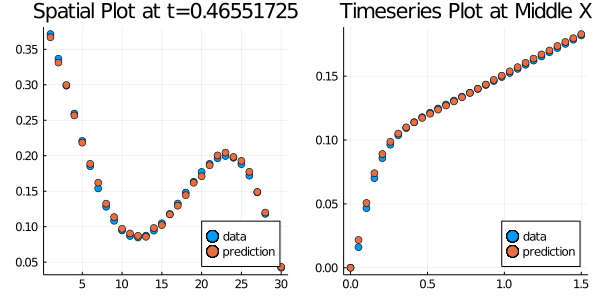

0.01763421f0

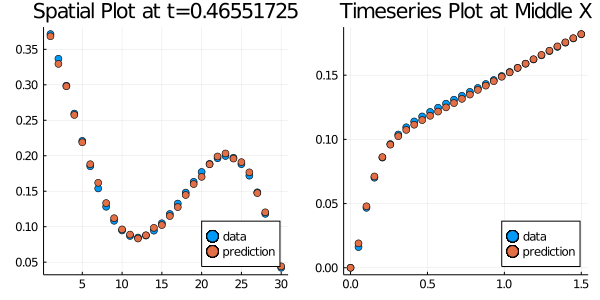

0.015428603f0

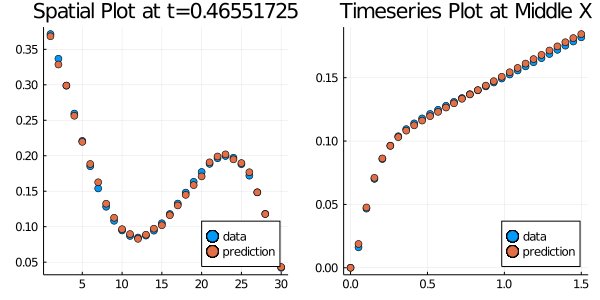

0.014088502f0

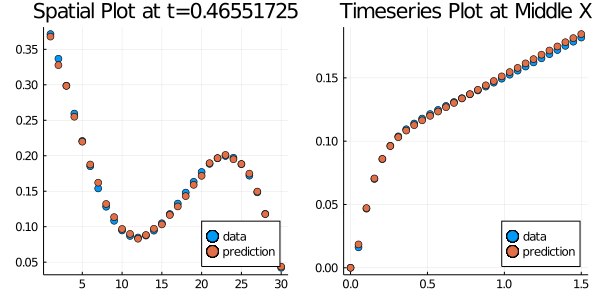

0.012699332f0

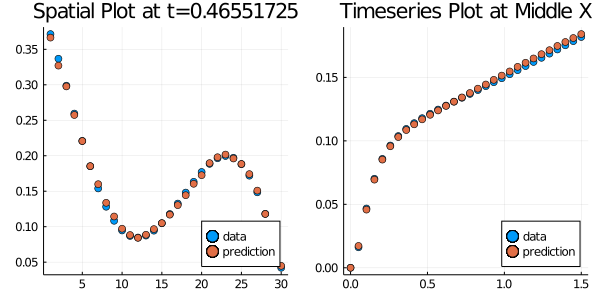

0.0105223665f0

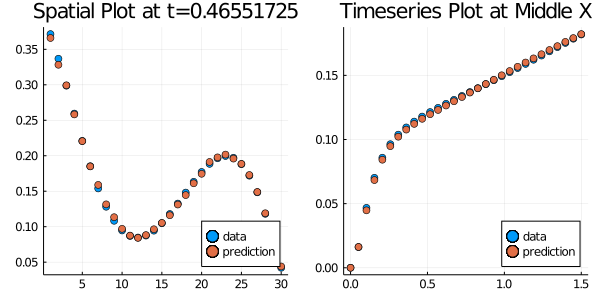

0.009437348f0

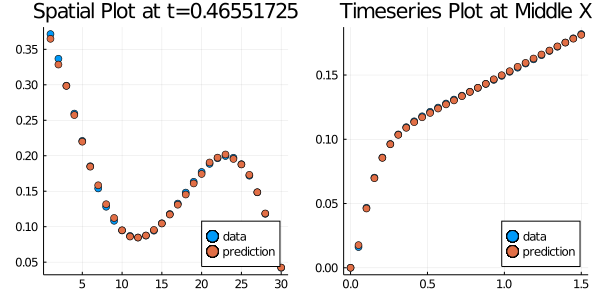

0.00838011f0

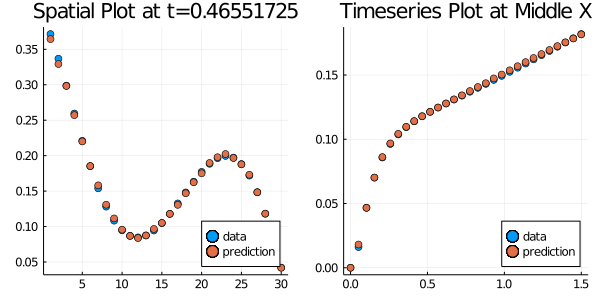

0.0075289723f0

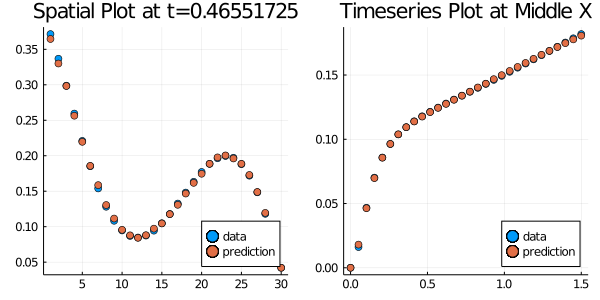

0.0066670063f0

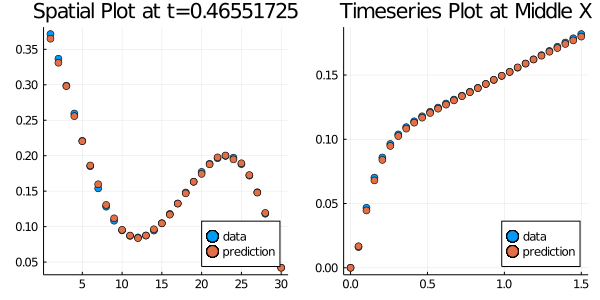

0.005838608f0

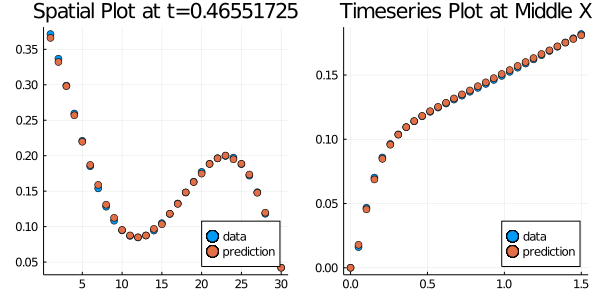

0.005150452f0

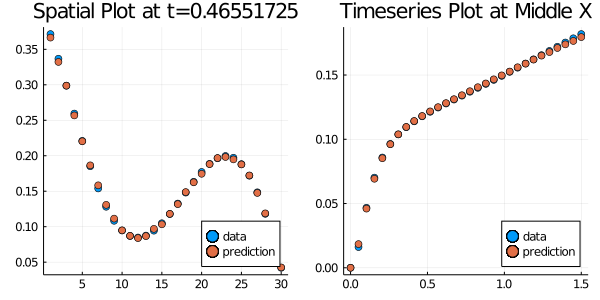

0.0046764407f0

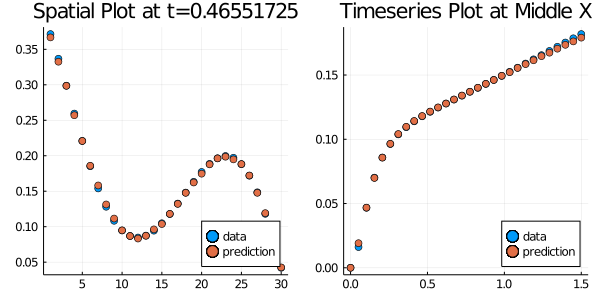

0.004331451f0

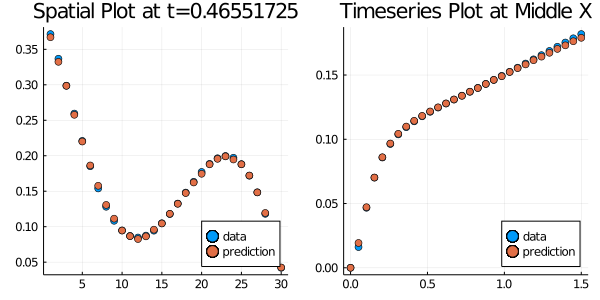

0.004126248f0

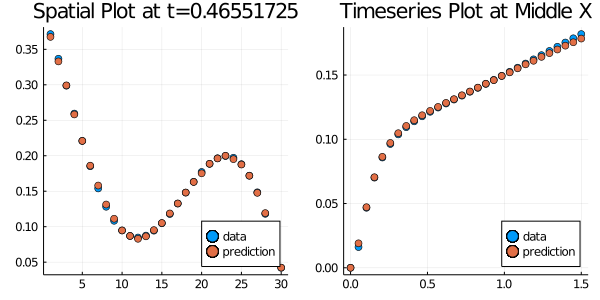

0.0039103944f0

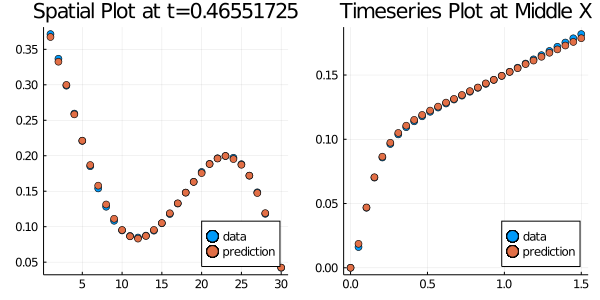

0.0037599872f0

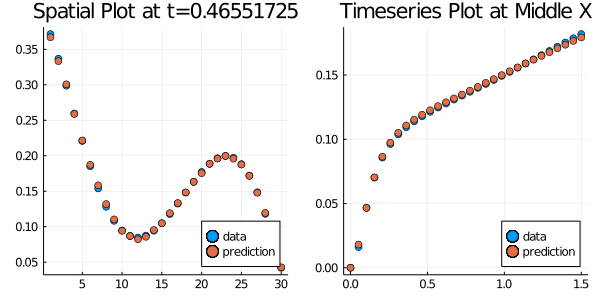

0.0035013438f0

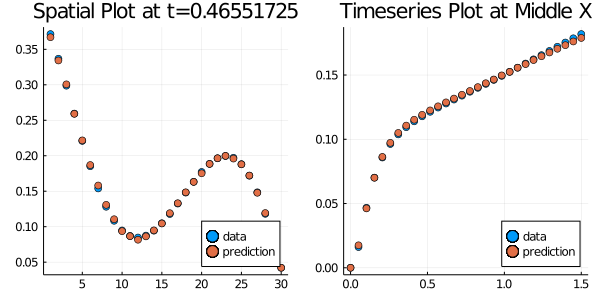

0.0033339488f0

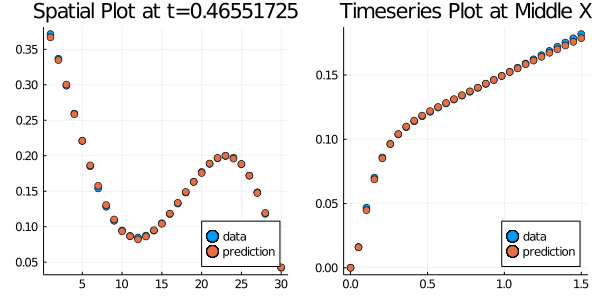

0.0030733487f0

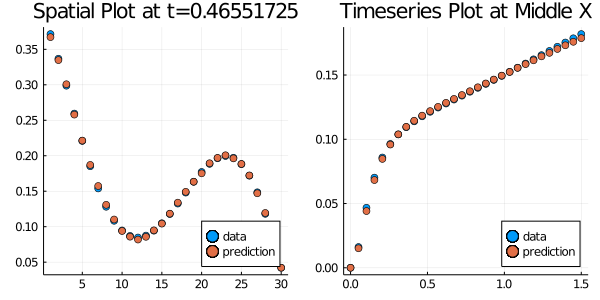

0.002902515f0

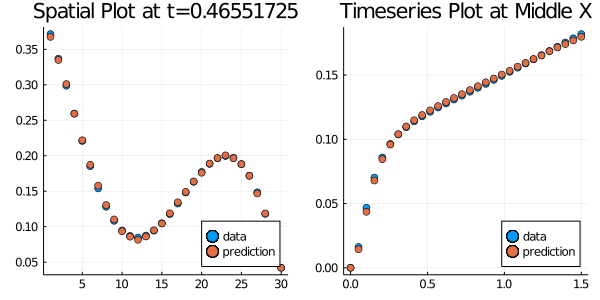

0.002694901f0

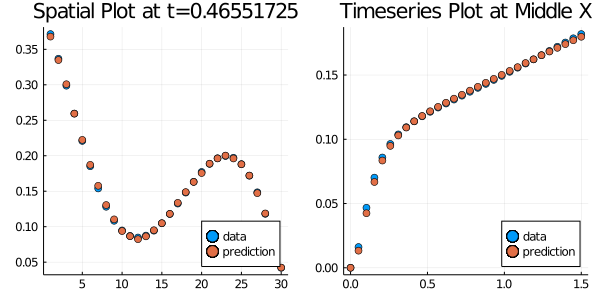

0.0025844118f0

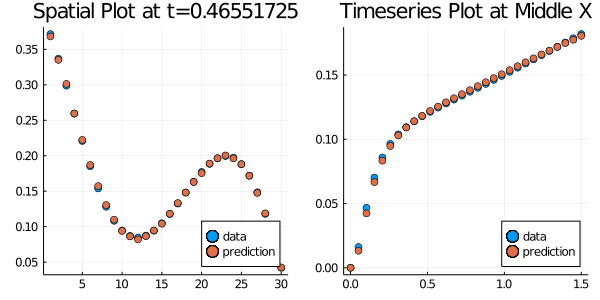

0.0024910904f0

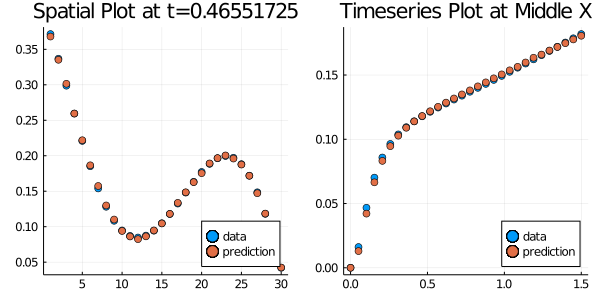

0.0023956662f0

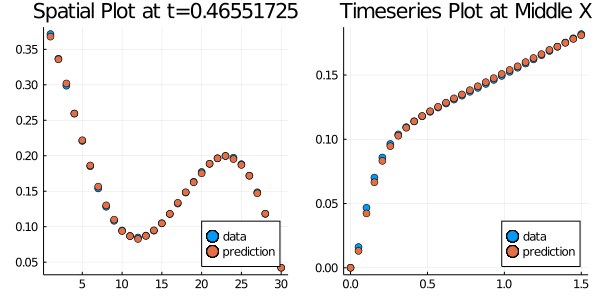

0.002274256f0

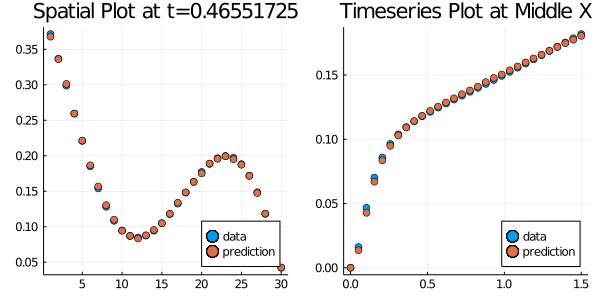

0.002177552f0

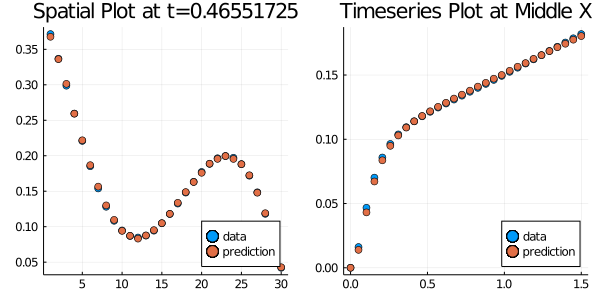

0.0020760577f0

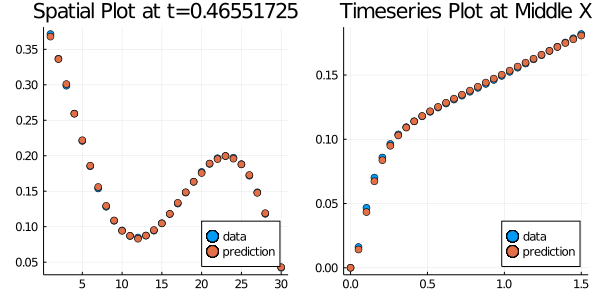

0.0019974923f0

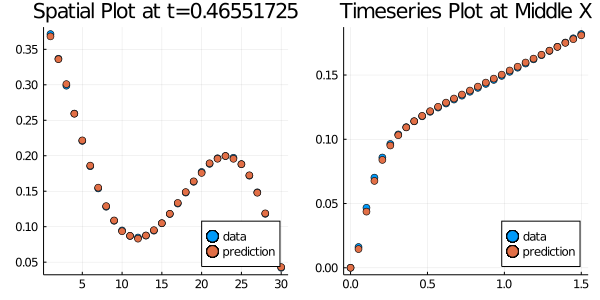

0.001922005f0

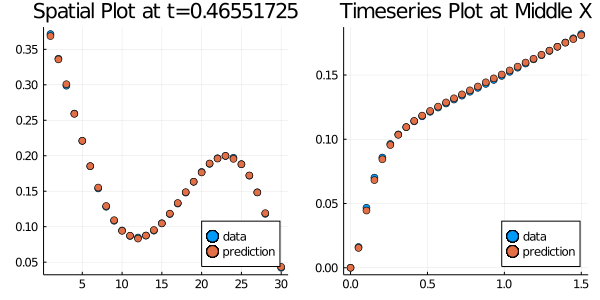

0.0017779134f0

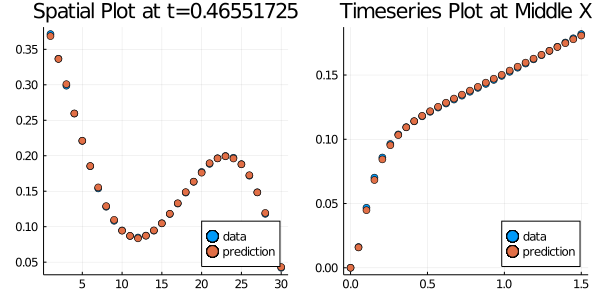

0.0016591306f0

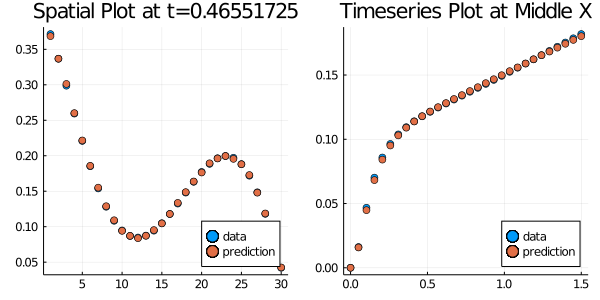

0.0015397144f0

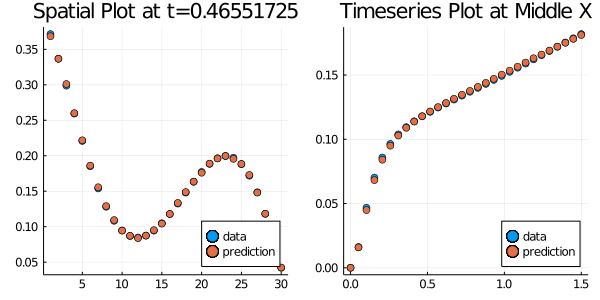

0.0014275907f0

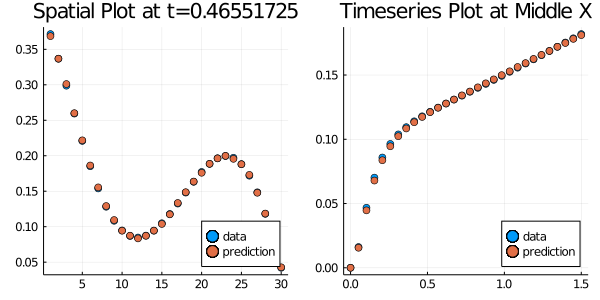

0.001351125f0

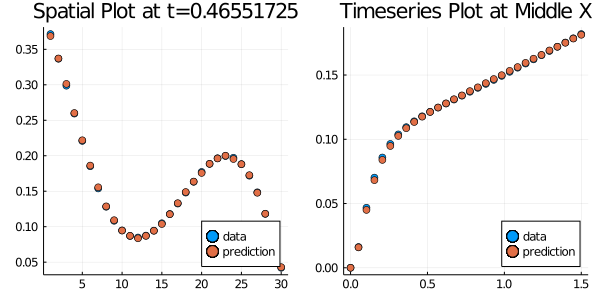

0.0013038738f0

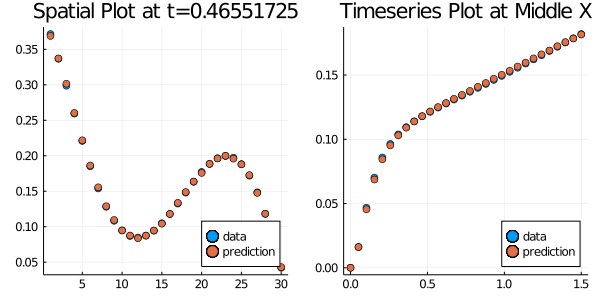

0.0012545089f0

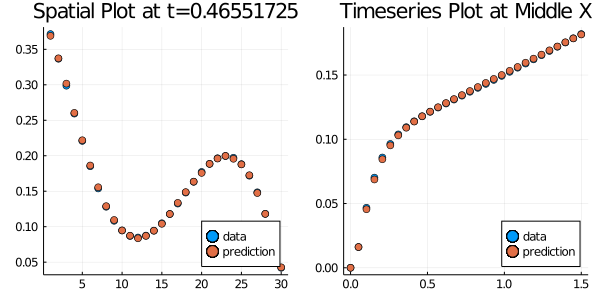

0.0012240804f0

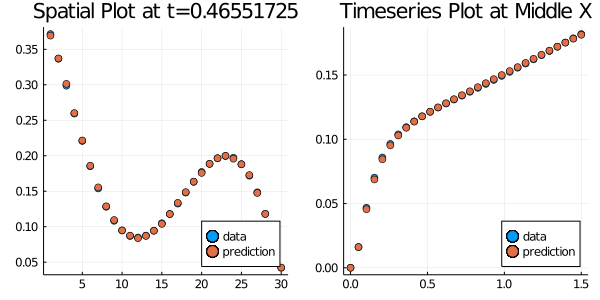

0.0011909812f0

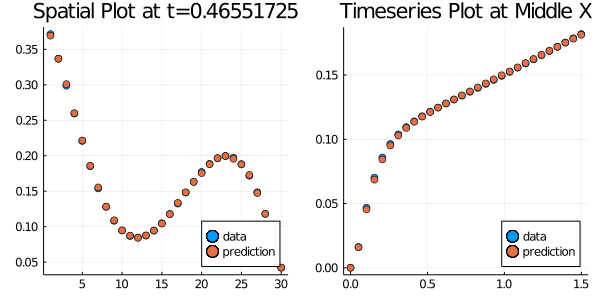

0.0010903651f0

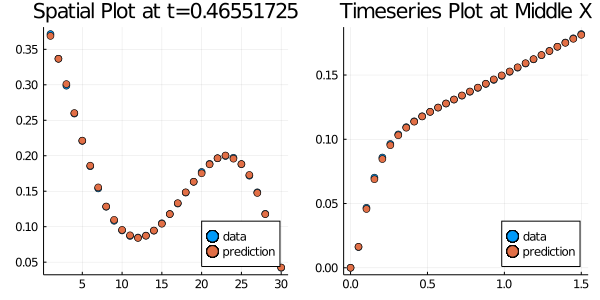

0.000976351f0

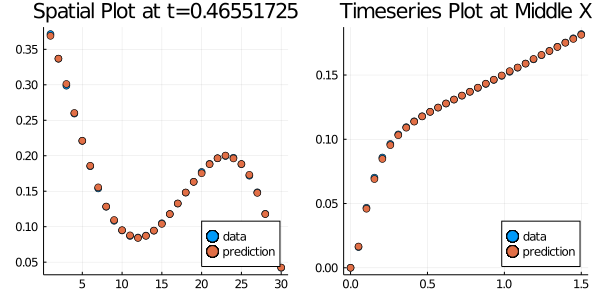

0.00092868507f0

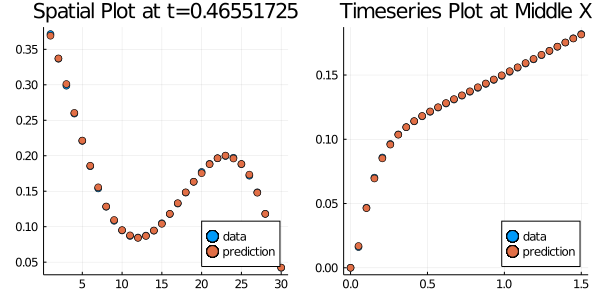

0.00089569826f0

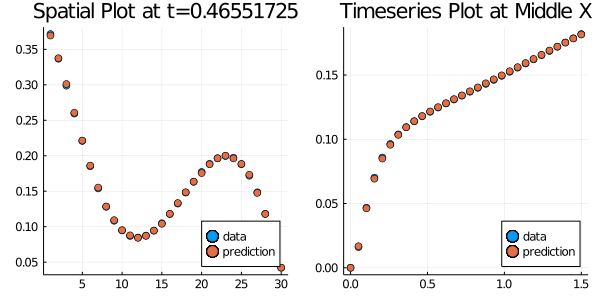

0.000877135f0

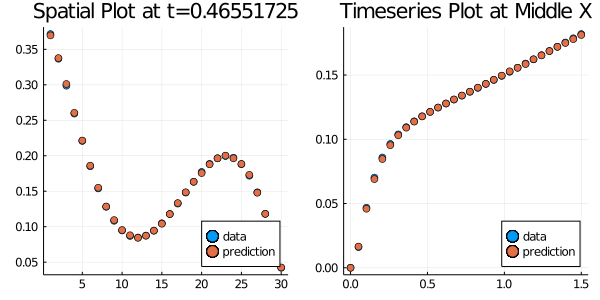

0.00085814315f0

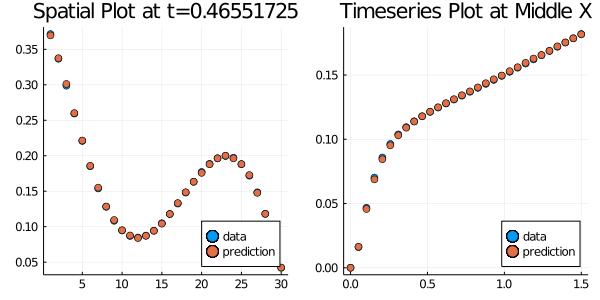

0.0008275452f0

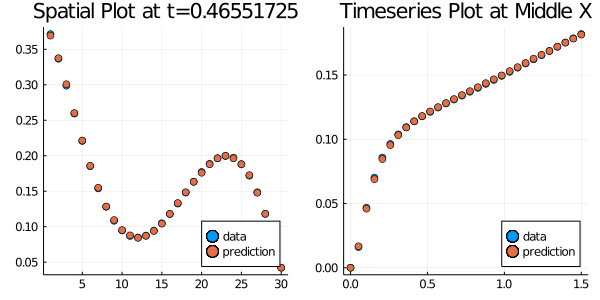

0.00079360197f0

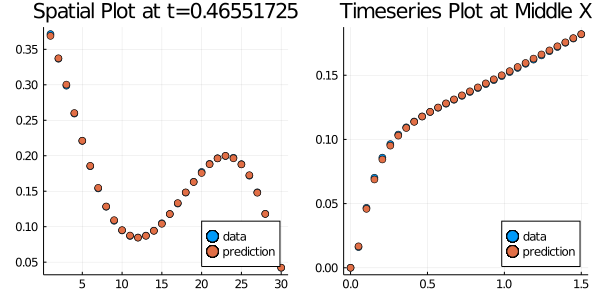

0.00073352735f0

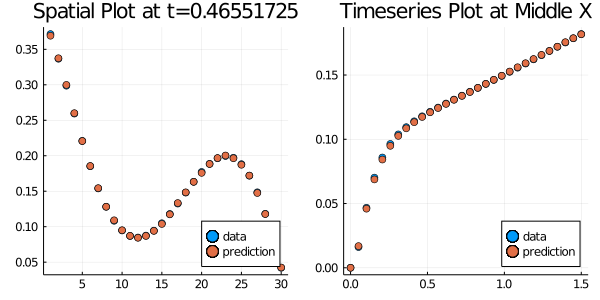

0.00062155316f0

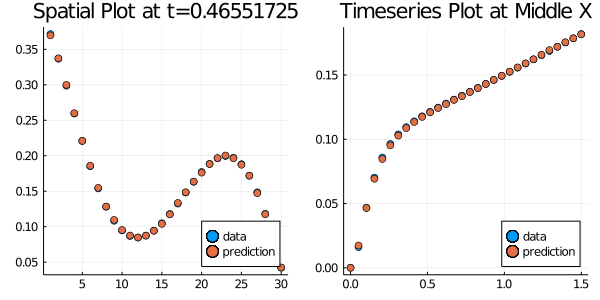

0.00052241667f0

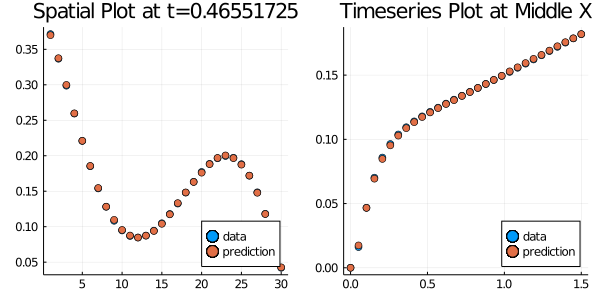

0.00047510915f0

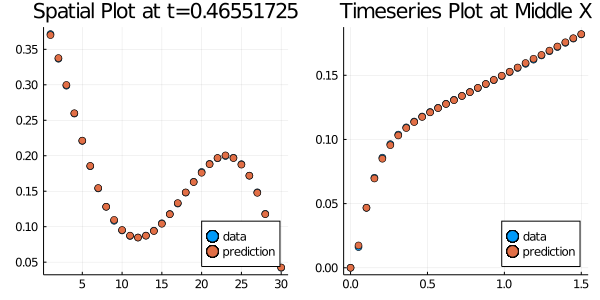

0.00046068945f0

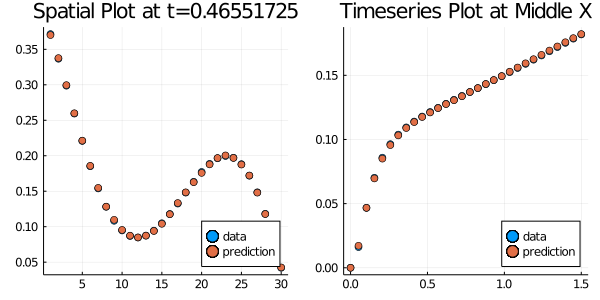

0.0004405835f0

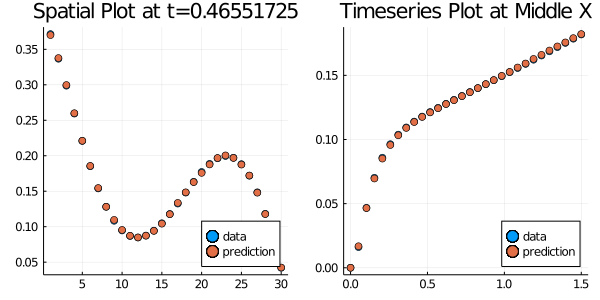

0.00042095245f0

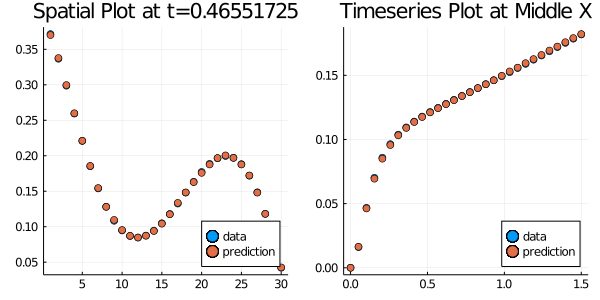

0.00041043706f0

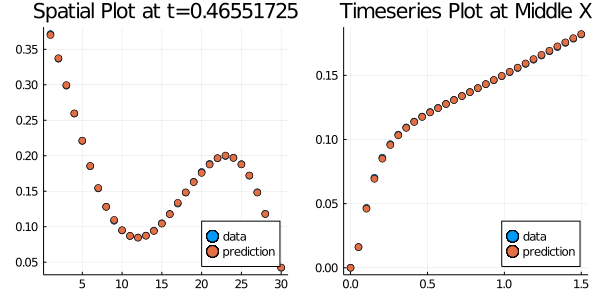

0.00039174032f0

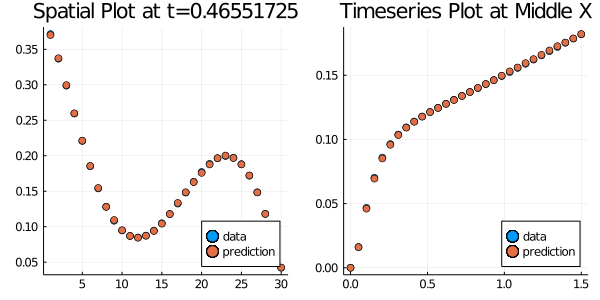

0.00038611997f0

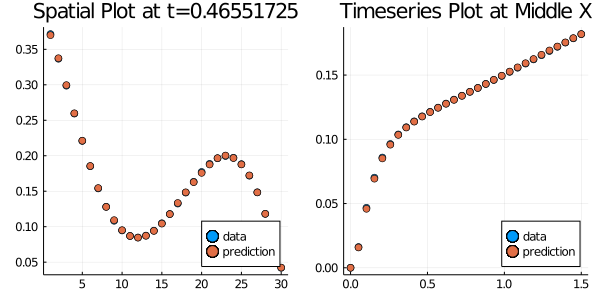

0.00037018466f0

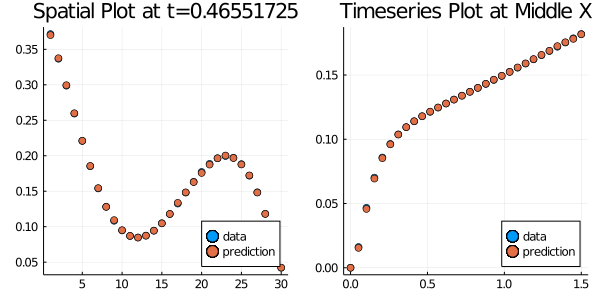

0.00035619183f0

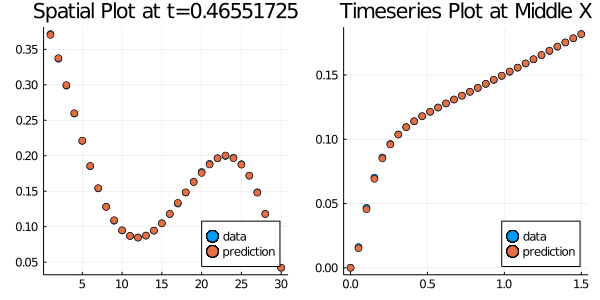

0.00033573195f0

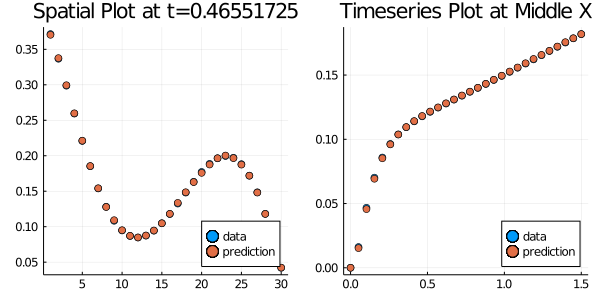

0.0003226914f0

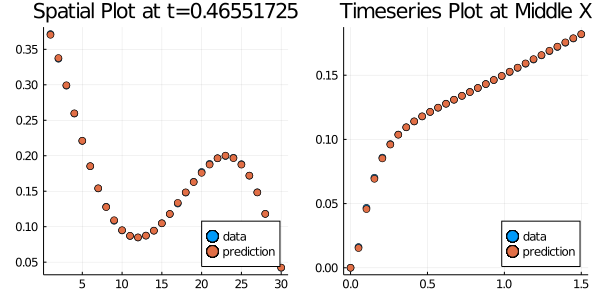

0.00031408173f0

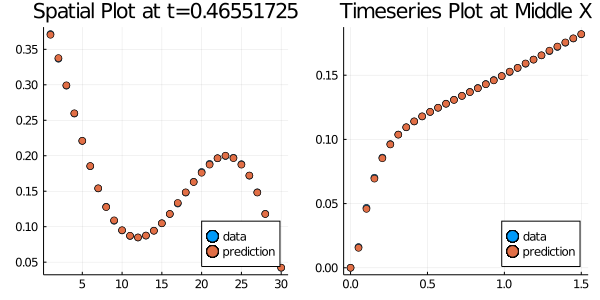

0.00030621848f0

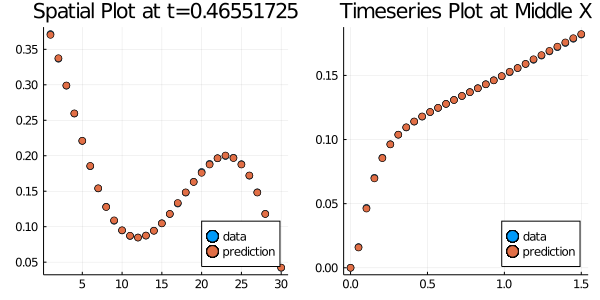

0.0002887559f0

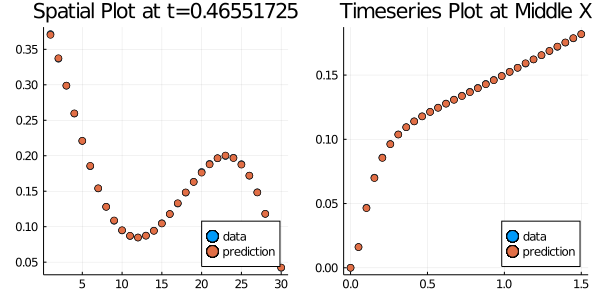

0.00026769566f0

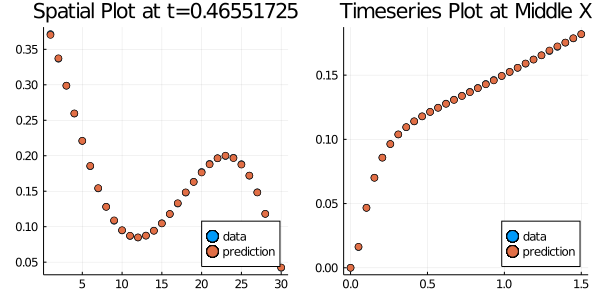

0.00026119183f0

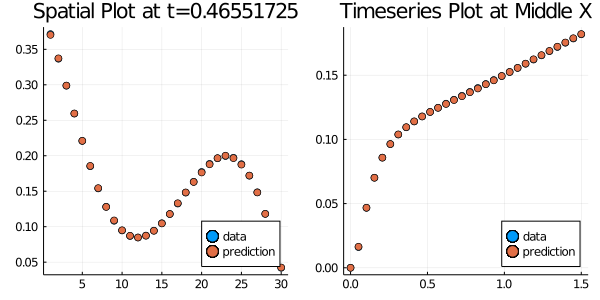

0.00024862212f0

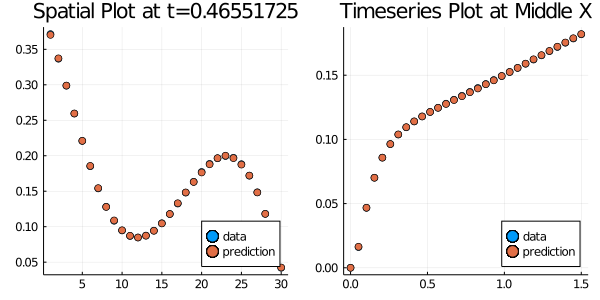

0.00024862212f0

┌ Warning: dt <= dtmin. Aborting. There is either an error in your model specification or the true solution is unstable.
└ @ DiffEqBase /home/vavrines/.julia/packages/DiffEqBase/V7P18/src/integrator_interface.jl:343
┌ Warning: dt <= dtmin. Aborting. There is either an error in your model specification or the true solution is unstable.
└ @ DiffEqBase /home/vavrines/.julia/packages/DiffEqBase/V7P18/src/integrator_interface.jl:343


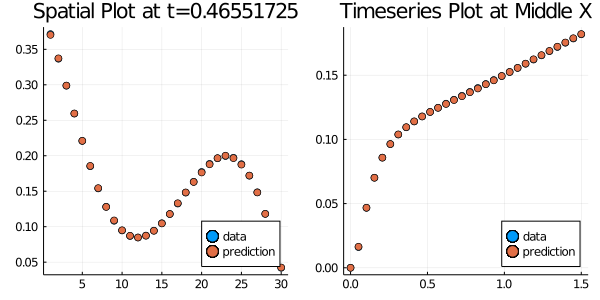

0.00024862212f0

 * Status: success

 * Candidate solution
    Final objective value:     2.486221e-04

 * Found with
    Algorithm:     BFGS

 * Convergence measures
    |x - x'|               = 6.98e-10 ≰ 0.0e+00
    |x - x'|/|x'|          = 6.16e-10 ≰ 0.0e+00
    |f(x) - f(x')|         = 0.00e+00 ≤ 0.0e+00
    |f(x) - f(x')|/|f(x')| = 0.00e+00 ≤ 0.0e+00
    |g(x)|                 = 1.91e-03 ≰ 1.0e-08

 * Work counters
    Seconds run:   51  (vs limit Inf)
    Iterations:    100
    f(x) calls:    372
    ∇f(x) calls:   372


In [77]:
function loss_adjoint_gradient!(G, fullp)
    G .= Zygote.gradient(loss_adjoint, fullp)[1]
end

result =  optimize(loss_adjoint, loss_adjoint_gradient!, pp, BFGS(), Optim.Options(extended_trace=true,callback = cb))

In [78]:
prob2 = ODEProblem{false}(dudt_,u0,(0f0,10f0),pp)
@time full_sol = solve(prob2,
                       ROCK2(eigen_est = (integ)->integ.eigen_est = EIGEN_EST[]),
                       saveat = saveat, abstol=1e-4, reltol=1e-2)

cur_pred = collect((predict_adjoint(result.minimizer)))
n = size(training_data, 1)

  3.129237 seconds (6.11 M allocations: 340.986 MiB, 1.94% gc time)


30

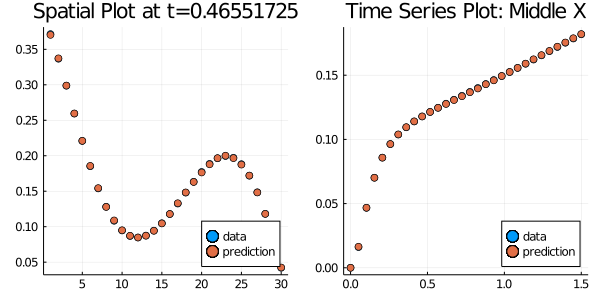

In [79]:
pl = scatter(1:n,training_data[:,10],label="data", legend =:bottomright)
scatter!(pl,1:n,cur_pred[:,10],label="prediction",title="Spatial Plot at t=$(saveat[10])")
pl2 = scatter(saveat,training_data[N÷2,:],label="data", legend =:bottomright, title="Time Series Plot: Middle X")
scatter!(pl2,saveat,cur_pred[N÷2,:],label="prediction")
plot(pl, pl2, size=(600, 300))

In [80]:
savefig("npde_fit.pdf")